# **Section 1:** Working with sample data (part of the original dataset) for understanding

---



In [1]:
#Import Necessary Packages

import json
import networkx as nx
import gurobipy as gp
from gurobipy import GRB
import matplotlib.pyplot as plt

In [2]:
#Function to Create a graph from given data

def create_graph(data):
    G = nx.DiGraph()

    # Create nodes
    counter = 0
    for element in data:
        #print(element)
        G.add_nodes_from([(counter, element)])
        counter += 1
    print(G.nodes)

    donor_recipient_compatibility = {'O': ['O', 'A', 'B', 'AB'], 'A': ['A', 'AB'], 'B':['B', 'AB'], 'AB':['AB']}

    # Create edges (relations)
    for node in G.nodes:
        donors = G.nodes[node]['Donor']
        #print(donors)
        for donor in donors:
            for vertex in G.nodes:
                if node == vertex: continue
                recipient = G.nodes[vertex]['Recipient']
                if recipient not in donor_recipient_compatibility[donor]: continue
                G.add_edge(node, vertex)

    print('edges:', G.edges)
    return G

In [3]:
# Open and read the JSON file
with open(r"C:\Users\souja\Downloads\Red.json", 'r') as file: data = json.load(file)

#Sample data (some 30 datapoints of the original dataset)
data = data[70:100]
G = create_graph(data)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]
edges: [(0, 1), (0, 4), (0, 6), (0, 9), (0, 10), (0, 11), (0, 16), (0, 18), (0, 22), (0, 26), (0, 27), (0, 28), (1, 5), (1, 8), (1, 13), (1, 14), (1, 15), (1, 21), (1, 23), (1, 24), (2, 1), (2, 4), (2, 6), (2, 9), (2, 10), (2, 11), (2, 16), (2, 18), (2, 22), (2, 26), (2, 27), (2, 28), (2, 5), (2, 8), (2, 13), (2, 14), (2, 15), (2, 21), (2, 23), (2, 24), (3, 1), (3, 4), (3, 6), (3, 9), (3, 10), (3, 11), (3, 16), (3, 18), (3, 22), (3, 26), (3, 27), (3, 28), (3, 5), (3, 8), (3, 13), (3, 14), (3, 15), (3, 21), (3, 23), (3, 24), (4, 5), (4, 8), (4, 13), (4, 14), (4, 15), (4, 21), (4, 23), (4, 24), (5, 1), (5, 4), (5, 6), (5, 9), (5, 10), (5, 11), (5, 16), (5, 18), (5, 22), (5, 26), (5, 27), (5, 28), (6, 5), (6, 8), (6, 13), (6, 14), (6, 15), (6, 21), (6, 23), (6, 24), (7, 1), (7, 4), (7, 6), (7, 9), (7, 10), (7, 11), (7, 16), (7, 18), (7, 22), (7, 26), (7, 27), (7, 28), (7, 5), (7,

In [4]:
#Function to visualize the graph with node information

def display_graph_w_donor_recipient(G):
    # Prepare labels to include node number, donor, and recipient
    labels = {
        node: f"Node: {node}\nDonor: {G.nodes[node]['Donor']}\nRecipient: {G.nodes[node]['Recipient']}"
        for node in G.nodes
    }

    # Dynamically calculate plot and node size based on number of nodes
    num_nodes = len(G.nodes)

    # Adjust figure size based on number of nodes
    fig_size = max(10, int(10 * (num_nodes**0.1)))
    plt.figure(figsize=(fig_size, fig_size))

    # Adjust node size based on number of nodes
    node_size = max(500, int(3000 / (num_nodes**0.1)))

    print(fig_size, node_size)

    pos = nx.circular_layout(G) 

    # Draw the graph with adjusted parameters
    nx.draw(G,
            pos,
            labels=labels,
            with_labels=True,
            node_size=node_size,
            connectionstyle="arc3,rad=0.1",
            font_size=max(6, int(10 / (num_nodes**0.2))), 
            font_weight='bold')

    plt.title(f"Graph with {num_nodes} Nodes - Selected Edges and Node Information")
    plt.tight_layout()  
    plt.show()


14 2135


C:\Users\souja\AppData\Local\Temp\ipykernel_8788\361724868.py:35: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


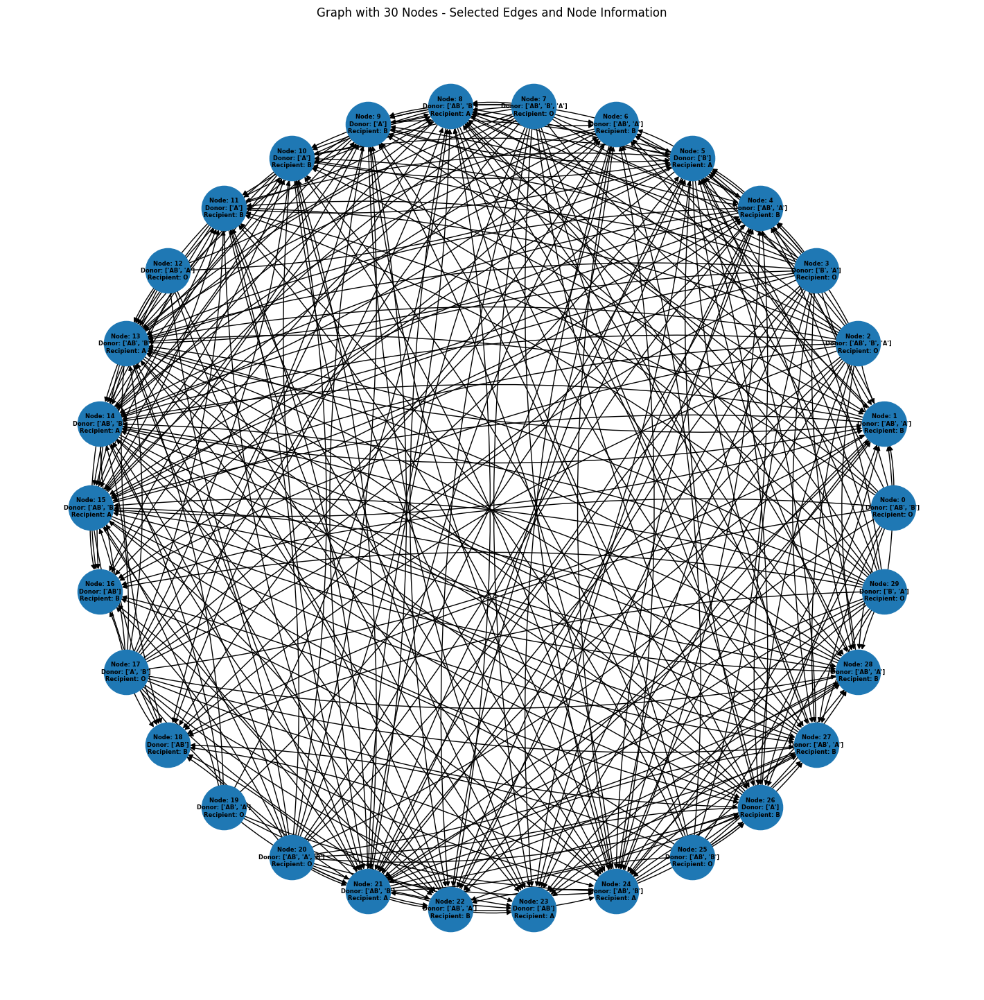

In [5]:
display_graph_w_donor_recipient(G)

In [6]:
# Function to find cycles of length 3

H = G.to_undirected()
def find_cycles_of_length_3(G):
    potential_cycle_3 = []

    for (u,v) in H.edges:
        for k in nx.common_neighbors(H, u, v):
            potential_cycle_3.append((u,v,k))

    print("potential_cycle_3:", potential_cycle_3)

    cycle_3 = []

    for (u,v,k) in potential_cycle_3:
        if (u,v) in G.edges and (v,k) in G.edges and (k,u) in G.edges:
            cycle_3.append((u,v,k,u))
        if (v,u) in G.edges and (u,k) in G.edges and (k,v) in G.edges:
            cycle_3.append((v,u,k,v))

    print("cycle_3:", cycle_3)
    return cycle_3

In [7]:
cycle_3 = find_cycles_of_length_3(G)

potential_cycle_3: [(1, 5, 2), (1, 5, 3), (1, 5, 7), (1, 5, 17), (1, 5, 20), (1, 5, 29), (1, 8, 2), (1, 8, 3), (1, 8, 7), (1, 8, 17), (1, 8, 20), (1, 8, 29), (1, 13, 2), (1, 13, 3), (1, 13, 7), (1, 13, 17), (1, 13, 20), (1, 13, 29), (1, 14, 2), (1, 14, 3), (1, 14, 7), (1, 14, 17), (1, 14, 20), (1, 14, 29), (1, 15, 2), (1, 15, 3), (1, 15, 7), (1, 15, 17), (1, 15, 20), (1, 15, 29), (1, 21, 2), (1, 21, 3), (1, 21, 7), (1, 21, 17), (1, 21, 20), (1, 21, 29), (1, 23, 2), (1, 23, 3), (1, 23, 7), (1, 23, 17), (1, 23, 20), (1, 23, 29), (1, 24, 2), (1, 24, 3), (1, 24, 7), (1, 24, 17), (1, 24, 20), (1, 24, 29), (1, 2, 5), (1, 2, 8), (1, 2, 13), (1, 2, 14), (1, 2, 15), (1, 2, 21), (1, 2, 23), (1, 2, 24), (1, 3, 5), (1, 3, 8), (1, 3, 13), (1, 3, 14), (1, 3, 15), (1, 3, 21), (1, 3, 23), (1, 3, 24), (1, 7, 5), (1, 7, 8), (1, 7, 13), (1, 7, 14), (1, 7, 15), (1, 7, 21), (1, 7, 23), (1, 7, 24), (1, 17, 5), (1, 17, 8), (1, 17, 13), (1, 17, 14), (1, 17, 15), (1, 17, 21), (1, 17, 23), (1, 17, 24), (1, 20, 

In [8]:
# Function to find cycles of length 2
def find_cycles_of_length_2(G):
    cycle_2 = []

    for (i,j) in G.edges:
        G.edges[(i,j)]["visited"] = False

    for (i,j) in G.edges:
        if G.edges[(i,j)]["visited"] == True: continue
        if (j,i) in G.edges:
            cycle_2.append((i,j,i))
            G.edges[(j,i)]["visited"] = True

    print("cycles of length 2:", cycle_2)
    return cycle_2

In [9]:
# Function to find cycles of length 2 (simpler version)
def find_cycles_of_length_2_simple(G):
    cycle_2 = []

    for (u,v) in H.edges:
        if (u,v) in G.edges and (v,u) in G.edges:
            cycle_2.append((u,v,u))

    print("cycles of length 2:", cycle_2)
    return cycle_2

In [10]:
cycle_2 = find_cycles_of_length_2_simple(G)

cycles of length 2: [(1, 5, 1), (1, 8, 1), (1, 13, 1), (1, 14, 1), (1, 15, 1), (1, 21, 1), (1, 24, 1), (4, 5, 4), (4, 8, 4), (4, 13, 4), (4, 14, 4), (4, 15, 4), (4, 21, 4), (4, 24, 4), (5, 6, 5), (5, 9, 5), (5, 10, 5), (5, 11, 5), (5, 22, 5), (5, 26, 5), (5, 27, 5), (5, 28, 5), (6, 8, 6), (6, 13, 6), (6, 14, 6), (6, 15, 6), (6, 21, 6), (6, 24, 6), (8, 9, 8), (8, 10, 8), (8, 11, 8), (8, 22, 8), (8, 26, 8), (8, 27, 8), (8, 28, 8), (9, 13, 9), (9, 14, 9), (9, 15, 9), (9, 21, 9), (9, 24, 9), (10, 13, 10), (10, 14, 10), (10, 15, 10), (10, 21, 10), (10, 24, 10), (11, 13, 11), (11, 14, 11), (11, 15, 11), (11, 21, 11), (11, 24, 11), (13, 22, 13), (13, 26, 13), (13, 27, 13), (13, 28, 13), (14, 22, 14), (14, 26, 14), (14, 27, 14), (14, 28, 14), (15, 22, 15), (15, 26, 15), (15, 27, 15), (15, 28, 15), (21, 22, 21), (21, 26, 21), (21, 27, 21), (21, 28, 21), (22, 24, 22), (24, 26, 24), (24, 27, 24), (24, 28, 24)]


In [11]:
# Function to create the model and find optimal solution maximizing edges

# Let's find a maximum matching
def find_max_matching(G):

    # Create the model within the Gurobi environment
    m = gp.Model()

    # Create variable for each edge
    x = m.addVars(G.edges, vtype=GRB.BINARY)

    # Objective function: maximize number of edges
    m.setObjective(gp.quicksum(x[e] for e in G.edges), GRB.MAXIMIZE)

    # The number of incomming arcs to each vertex is at most one
    m.addConstrs(gp.quicksum(x[(u,v)] for u in G.neighbors(v) if (u,v) in G.edges) <= 1 for v in G.nodes)

    # The number of incomming arcs should be equal to the number of outgoing arcs
    m.addConstrs(gp.quicksum(x[(u,v)] for u in G.neighbors(v) if (u,v) in G.edges) == gp.quicksum(x[(v,u)] for u in G.neighbors(v) if (v,u) in G.edges) for v in G.nodes)

    # Solve
    m.optimize()

    return m, x

In [12]:
m, x = find_max_matching(G)

Set parameter Username
Academic license - for non-commercial use only - expires 2025-09-13
Gurobi Optimizer version 11.0.3 build v11.0.3rc0 (win64 - Windows 11+.0 (26100.2))

CPU model: Intel(R) Core(TM) i7-8650U CPU @ 1.90GHz, instruction set [SSE2|AVX|AVX2]
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 60 rows, 324 columns and 604 nonzeros
Model fingerprint: 0x054e712d
Variable types: 0 continuous, 324 integer (324 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [1e+00, 1e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 1e+00]
Found heuristic solution: objective -0.0000000
Presolve removed 26 rows and 167 columns
Presolve time: 0.02s
Presolved: 34 rows, 157 columns, 437 nonzeros
Variable types: 0 continuous, 157 integer (157 binary)
Found heuristic solution: objective 14.0000000

Root relaxation: cutoff, 49 iterations, 0.01 seconds (0.00 work units)

    Nodes    |    Current No

In [13]:
print("Objective:",m.objVal)

selected_edges = [e for e in G.edges if x[e].X > 0.5]

Objective: 14.0


In [14]:
# Function to display the solution

def display_solution_w_donor_recipient(G, selected_edges):
    # Prepare labels to include node number, donor, and recipient
    labels = {
        node: f"Node: {node}\nDonor: {G.nodes[node]['Donor']}\nRecipient: {G.nodes[node]['Recipient']}"
        for node in G.nodes
    }

    # Dynamically calculate plot and node size based on number of nodes
    num_nodes = len(G.nodes)

    # Adjust figure size based on number of nodes
    fig_size = max(10, int(10 * (num_nodes**0.1)))
    plt.figure(figsize=(fig_size, fig_size))

    # Adjust node size based on number of nodes
    node_size = max(500, int(3000 / (num_nodes**0.1)))

    print(fig_size, node_size)
    # Determine edge colors
    edge_colors = ["red" if selected_edges and e in selected_edges else "black" for e in G.edges]

    # Determine node colors
    node_colors = ["green" if selected_edges and any(e[0] == node or e[1] == node for e in selected_edges) else "lightblue" for node in G.nodes]

    pos = nx.circular_layout(G) 

    # Draw the graph with adjusted parameters
    nx.draw(G,
            pos,
            labels=labels,
            with_labels=True,
            node_size=node_size,
            node_color=node_colors,
            edge_color=edge_colors,
            connectionstyle="arc3,rad=0.1",
            font_size=max(6, int(10 / (num_nodes**0.2))),  
            font_weight='bold')

    plt.title(f"Graph with {num_nodes} Nodes - Selected Edges and Node Information")
    plt.tight_layout()  
    plt.show()

14 2135


C:\Users\souja\AppData\Local\Temp\ipykernel_8788\3114893575.py:42: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


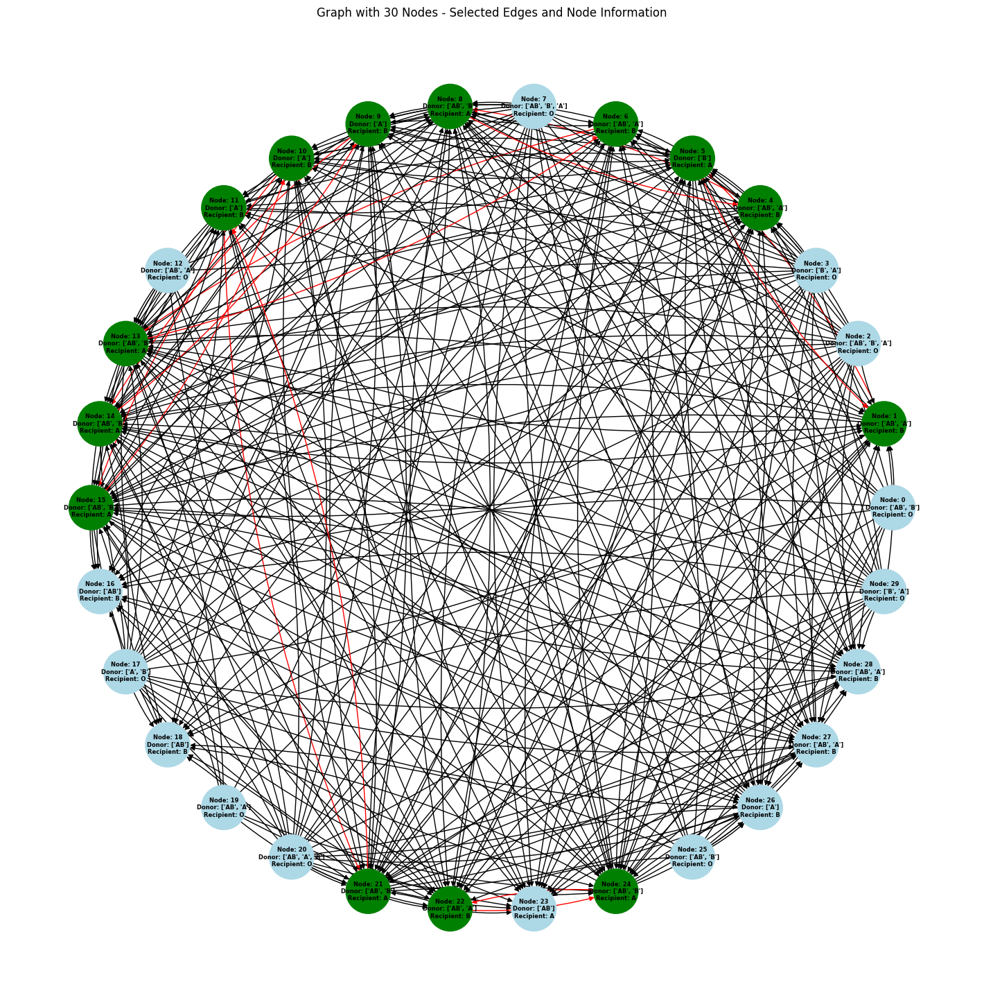

In [15]:
display_solution_w_donor_recipient(G, selected_edges)

In [16]:
# Function to create the model and find optimal 2 and 3 cycles solution
def find_max_matching_with_cycles(G):

    # Create the model within the Gurobi environment
    m = gp.Model()

    # Convert to undirected graph for cycle finding
    H = G.to_undirected()

    # Use the provided functions to find cycles of length 2 and 3
    cycle_2 = find_cycles_of_length_2_simple(G)
    cycle_3 = find_cycles_of_length_3(G)

    # Combine all identified cycles
    all_cycles = cycle_2 + cycle_3

    # Create binary variables for each cycle
    cycle_vars = m.addVars(len(all_cycles), vtype=GRB.BINARY, name="cycle")

    # Objective: Maximize the number of selected cycles
    m.setObjective(gp.quicksum(cycle_vars[c] for c in range(len(all_cycles))), GRB.MAXIMIZE)

    # Constraint: No node can be part of more than one cycle
    for node in G.nodes:
        m.addConstr(
            gp.quicksum(cycle_vars[c] for c in range(len(all_cycles)) if node in all_cycles[c]) <= 1
        )

    # Solve the optimization problem
    m.optimize()

    # Extract the solution
    selected_cycles = [all_cycles[c] for c in range(len(all_cycles)) if cycle_vars[c].x > 0.5]

    selected_edges = set()
    for cycle in selected_cycles:
        selected_edges.update((cycle[i], cycle[i+1]) for i in range(len(cycle) - 1))

    return m, selected_edges

m, selected_edges = find_max_matching_with_cycles(G)

cycles of length 2: [(1, 5, 1), (1, 8, 1), (1, 13, 1), (1, 14, 1), (1, 15, 1), (1, 21, 1), (1, 24, 1), (4, 5, 4), (4, 8, 4), (4, 13, 4), (4, 14, 4), (4, 15, 4), (4, 21, 4), (4, 24, 4), (5, 6, 5), (5, 9, 5), (5, 10, 5), (5, 11, 5), (5, 22, 5), (5, 26, 5), (5, 27, 5), (5, 28, 5), (6, 8, 6), (6, 13, 6), (6, 14, 6), (6, 15, 6), (6, 21, 6), (6, 24, 6), (8, 9, 8), (8, 10, 8), (8, 11, 8), (8, 22, 8), (8, 26, 8), (8, 27, 8), (8, 28, 8), (9, 13, 9), (9, 14, 9), (9, 15, 9), (9, 21, 9), (9, 24, 9), (10, 13, 10), (10, 14, 10), (10, 15, 10), (10, 21, 10), (10, 24, 10), (11, 13, 11), (11, 14, 11), (11, 15, 11), (11, 21, 11), (11, 24, 11), (13, 22, 13), (13, 26, 13), (13, 27, 13), (13, 28, 13), (14, 22, 14), (14, 26, 14), (14, 27, 14), (14, 28, 14), (15, 22, 15), (15, 26, 15), (15, 27, 15), (15, 28, 15), (21, 22, 21), (21, 26, 21), (21, 27, 21), (21, 28, 21), (22, 24, 22), (24, 26, 24), (24, 27, 24), (24, 28, 24)]
potential_cycle_3: [(1, 5, 2), (1, 5, 3), (1, 5, 7), (1, 5, 17), (1, 5, 20), (1, 5, 29)

14 2135


C:\Users\souja\AppData\Local\Temp\ipykernel_8788\3114893575.py:42: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


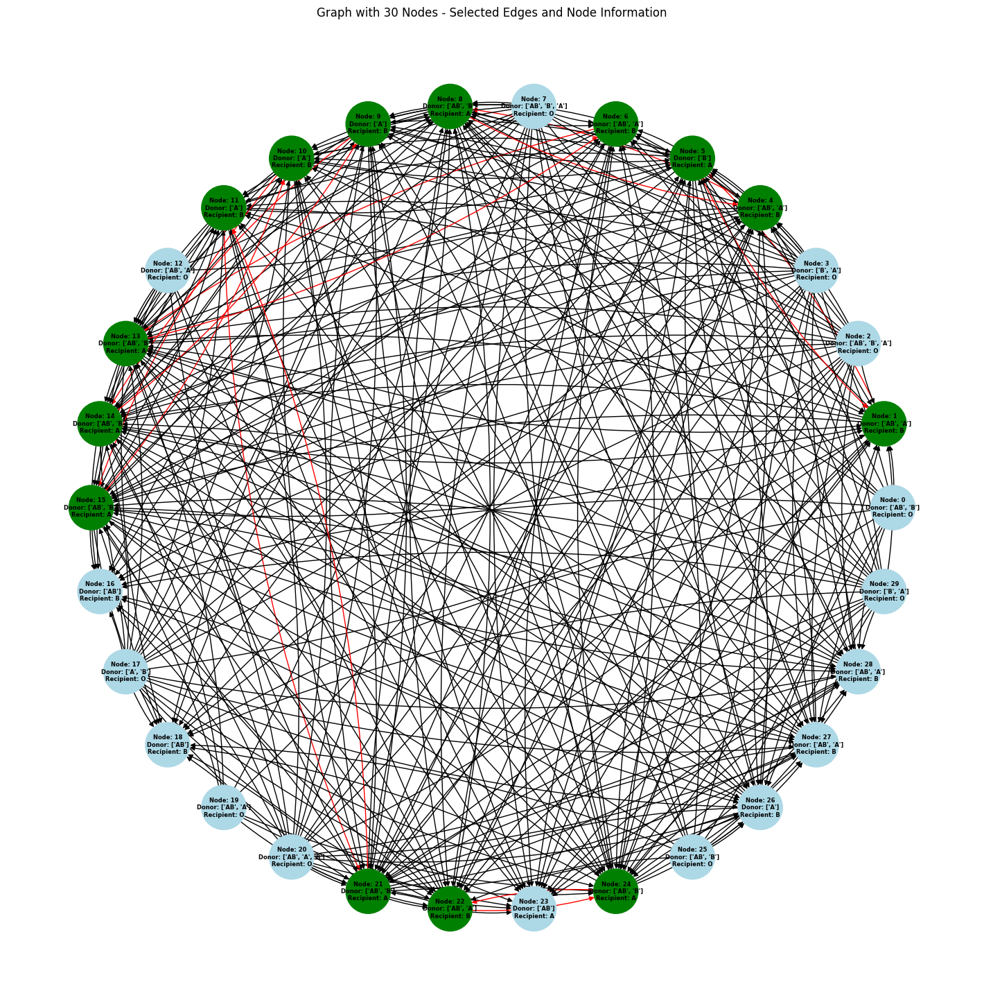

In [17]:
display_solution_w_donor_recipient(G, selected_edges)

In [19]:
# Function to display solution and export to json file.

def detailed_optimization_output(selected_edges, G):
    print("\nOptimization Results:")
    if selected_edges:
        print(f"Total Selected Edges: {len(selected_edges)}")
        print("Selected Exchanges:")
        for edge in selected_edges:
            print(f"Exchange: {edge} (Donor {G.nodes[edge[0]]['Donor']} to Recipient {G.nodes[edge[1]]['Recipient']})")
    else:
        print("No valid cycles or exchanges found.")

def export_results_to_json(selected_edges, G, file_name="kpd_results_test.json"):
    results = []
    for edge in selected_edges:
        results.append({
            "Donor": G.nodes[edge[0]]["Donor"],
            "Recipient": G.nodes[edge[1]]["Recipient"],
            "Edge": list(edge)  # Convert tuple to list for JSON compatibility
        })
    with open(file_name, "w") as f:
        json.dump(results, f, indent=4)
    print(f"Results exported to {file_name}")


# Call the detailed optimization output
detailed_optimization_output(selected_edges, G)
# Export the results
export_results_to_json(selected_edges, G, "kpd_results_test.json")


Optimization Results:
Total Selected Edges: 14
Selected Exchanges:
Exchange: (10, 15) (Donor ['A'] to Recipient A)
Exchange: (8, 4) (Donor ['AB', 'B'] to Recipient B)
Exchange: (1, 5) (Donor ['AB', 'A'] to Recipient A)
Exchange: (22, 24) (Donor ['AB', 'A'] to Recipient A)
Exchange: (5, 1) (Donor ['B'] to Recipient B)
Exchange: (15, 10) (Donor ['AB', 'B'] to Recipient B)
Exchange: (6, 13) (Donor ['AB', 'A'] to Recipient A)
Exchange: (14, 9) (Donor ['AB', 'B'] to Recipient B)
Exchange: (13, 6) (Donor ['AB', 'B'] to Recipient B)
Exchange: (4, 8) (Donor ['AB', 'A'] to Recipient A)
Exchange: (9, 14) (Donor ['A'] to Recipient A)
Exchange: (11, 21) (Donor ['A'] to Recipient A)
Exchange: (24, 22) (Donor ['AB', 'B'] to Recipient B)
Exchange: (21, 11) (Donor ['AB', 'B'] to Recipient B)
Results exported to kpd_results_test.json


# **Section 2: Working with Complete Dataset**

In [20]:
#Open and read the JSON file
with open(r"C:\Users\souja\Downloads\Red.json", 'r') as file: data = json.load(file)
G = create_graph(data)
H = G.to_undirected()

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,

In [21]:
cycle_3 = find_cycles_of_length_3(G)

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



cycle_3: []


In [22]:
cycle_2 = find_cycles_of_length_2_simple(G)

cycles of length 2: [(2, 3, 2), (2, 5, 2), (2, 9, 2), (2, 15, 2), (2, 16, 2), (2, 25, 2), (2, 26, 2), (2, 39, 2), (2, 41, 2), (2, 49, 2), (2, 52, 2), (2, 54, 2), (2, 56, 2), (2, 57, 2), (2, 62, 2), (2, 66, 2), (2, 67, 2), (2, 75, 2), (2, 78, 2), (2, 83, 2), (2, 84, 2), (2, 85, 2), (2, 91, 2), (2, 94, 2), (2, 103, 2), (2, 108, 2), (2, 109, 2), (2, 110, 2), (2, 112, 2), (2, 122, 2), (2, 129, 2), (2, 131, 2), (2, 138, 2), (2, 139, 2), (2, 144, 2), (2, 148, 2), (2, 151, 2), (2, 155, 2), (2, 156, 2), (2, 158, 2), (2, 159, 2), (2, 160, 2), (2, 164, 2), (2, 165, 2), (2, 166, 2), (2, 186, 2), (2, 187, 2), (2, 188, 2), (2, 197, 2), (2, 203, 2), (2, 207, 2), (2, 214, 2), (2, 215, 2), (2, 230, 2), (2, 236, 2), (2, 237, 2), (2, 242, 2), (2, 243, 2), (2, 244, 2), (2, 249, 2), (2, 252, 2), (2, 253, 2), (2, 254, 2), (2, 255, 2), (2, 257, 2), (2, 258, 2), (2, 260, 2), (2, 261, 2), (2, 264, 2), (2, 271, 2), (2, 281, 2), (2, 282, 2), (2, 283, 2), (2, 289, 2), (2, 295, 2), (2, 297, 2), (2, 299, 2), (2, 3

In [23]:
m, selected_edges = find_max_matching_with_cycles(G)

cycles of length 2: [(2, 3, 2), (2, 5, 2), (2, 9, 2), (2, 15, 2), (2, 16, 2), (2, 25, 2), (2, 26, 2), (2, 39, 2), (2, 41, 2), (2, 49, 2), (2, 52, 2), (2, 54, 2), (2, 56, 2), (2, 57, 2), (2, 62, 2), (2, 66, 2), (2, 67, 2), (2, 75, 2), (2, 78, 2), (2, 83, 2), (2, 84, 2), (2, 85, 2), (2, 91, 2), (2, 94, 2), (2, 103, 2), (2, 108, 2), (2, 109, 2), (2, 110, 2), (2, 112, 2), (2, 122, 2), (2, 129, 2), (2, 131, 2), (2, 138, 2), (2, 139, 2), (2, 144, 2), (2, 148, 2), (2, 151, 2), (2, 155, 2), (2, 156, 2), (2, 158, 2), (2, 159, 2), (2, 160, 2), (2, 164, 2), (2, 165, 2), (2, 166, 2), (2, 186, 2), (2, 187, 2), (2, 188, 2), (2, 197, 2), (2, 203, 2), (2, 207, 2), (2, 214, 2), (2, 215, 2), (2, 230, 2), (2, 236, 2), (2, 237, 2), (2, 242, 2), (2, 243, 2), (2, 244, 2), (2, 249, 2), (2, 252, 2), (2, 253, 2), (2, 254, 2), (2, 255, 2), (2, 257, 2), (2, 258, 2), (2, 260, 2), (2, 261, 2), (2, 264, 2), (2, 271, 2), (2, 281, 2), (2, 282, 2), (2, 283, 2), (2, 289, 2), (2, 295, 2), (2, 297, 2), (2, 299, 2), (2, 3

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



cycle_3: []
Gurobi Optimizer version 11.0.3 build v11.0.3rc0 (win64 - Windows 11+.0 (26100.2))

CPU model: Intel(R) Core(TM) i7-8650U CPU @ 1.90GHz, instruction set [SSE2|AVX|AVX2]
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 745 rows, 35502 columns and 71004 nonzeros
Model fingerprint: 0xf110e591
Variable types: 0 continuous, 35502 integer (35502 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [1e+00, 1e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 1e+00]
Found heuristic solution: objective 183.0000000
Presolve removed 368 rows and 0 columns
Presolve time: 0.09s
Presolved: 377 rows, 35502 columns, 71004 nonzeros
Variable types: 0 continuous, 35502 integer (35502 binary)

Starting sifting (using dual simplex for sub-problems)...

    Iter     Pivots    Primal Obj      Dual Obj        Time
       0          0     infinity     -3.7600000e+02      0s
       1        477  -1.10000

In [24]:
print("Objective:",m.objVal)

Objective: 183.0


19 1548


<ipython-input-16-535c42db1aab>:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()  # Adjust layout to prevent cutting off labels


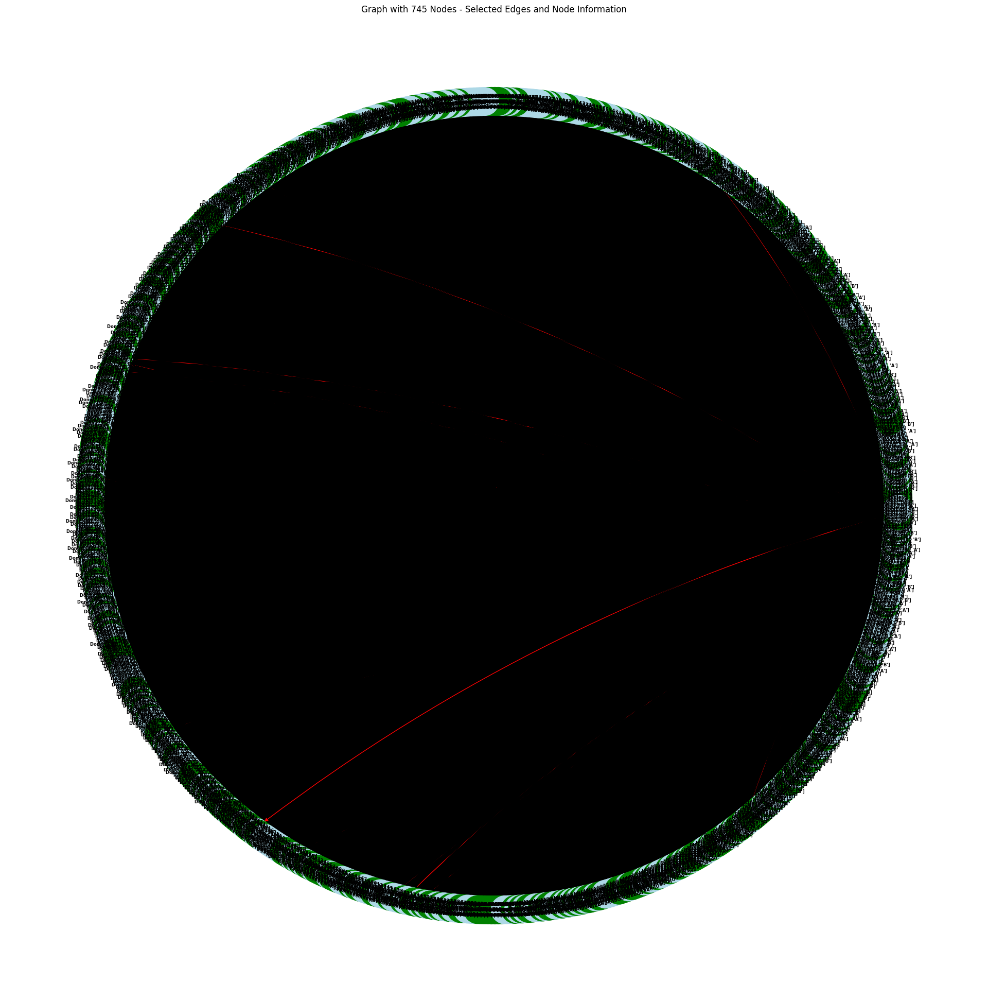

In [29]:
display_solution_w_donor_recipient(G, selected_edges)

In [25]:
# Call the detailed optimization output
detailed_optimization_output(selected_edges, G)
# Export the results
export_results_to_json(selected_edges, G, "kpd_results.json")


Optimization Results:
Total Selected Edges: 366
Selected Exchanges:
Exchange: (405, 463) (Donor ['B'] to Recipient B)
Exchange: (47, 62) (Donor ['AB', 'A'] to Recipient A)
Exchange: (170, 151) (Donor ['AB', 'A'] to Recipient A)
Exchange: (29, 41) (Donor ['A'] to Recipient A)
Exchange: (148, 141) (Donor ['B'] to Recipient B)
Exchange: (438, 496) (Donor ['AB', 'B'] to Recipient B)
Exchange: (546, 596) (Donor ['AB', 'B'] to Recipient B)
Exchange: (100, 110) (Donor ['A'] to Recipient A)
Exchange: (601, 630) (Donor ['B'] to Recipient B)
Exchange: (274, 244) (Donor ['AB', 'A'] to Recipient A)
Exchange: (623, 644) (Donor ['B'] to Recipient B)
Exchange: (618, 575) (Donor ['AB', 'A'] to Recipient A)
Exchange: (15, 7) (Donor ['B'] to Recipient B)
Exchange: (460, 403) (Donor ['AB', 'A'] to Recipient A)
Exchange: (500, 439) (Donor ['A'] to Recipient A)
Exchange: (158, 181) (Donor ['AB', 'B'] to Recipient B)
Exchange: (187, 217) (Donor ['AB', 'B'] to Recipient B)
Exchange: (368, 396) (Donor ['B'] 

In [26]:
# Simple analysis of the results

import json
from collections import defaultdict, Counter
import statistics

# Load the JSON data
file_path = r"C:\Users\souja\Downloads\kpd_results.json"
with open(file_path, 'r') as file:
    data = json.load(file)

def donor_recipient_analysis(data):
    donor_types = []
    recipient_types = []
    pairings = Counter()

    for entry in data:
        donor_types.extend(entry["Donor"])
        recipient_types.append(entry["Recipient"])
        pairings.update((donor, entry["Recipient"]) for donor in entry["Donor"])

    return {
        "donor_counts": Counter(donor_types),
        "recipient_counts": Counter(recipient_types),
        "pairings": pairings,
    }

# Perform analyses
donor_recipient_metrics = donor_recipient_analysis(data)


print("Donor and Recipient Analysis:")
print(f"  Donor Blood Type Counts: {donor_recipient_metrics['donor_counts']}")
print(f"  Recipient Blood Type Counts: {donor_recipient_metrics['recipient_counts']}")
print(f"  Pairings: {donor_recipient_metrics['pairings']}\n")




Donor and Recipient Analysis:
  Donor Blood Type Counts: Counter({'AB': 264, 'B': 183, 'A': 183})
  Recipient Blood Type Counts: Counter({'B': 183, 'A': 183})
  Pairings: Counter({('B', 'B'): 183, ('A', 'A'): 183, ('AB', 'A'): 133, ('AB', 'B'): 131})

